# Installation

In [1]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [2]:
!pip install fasttext

     |████████████████████████████████| 71kB 7.1MB/s 
  Created wheel for fasttext: filename=fasttext-0.9.2-cp36-cp36m-linux_x86_64.whl size=3038808 sha256=595c3838b59d1b6c11b6f58a4e7d3e4008e4560e0bfedd52acba1a0cd2204f40
  Stored in directory: /root/.cache/pip/wheels/98/ba/7f/b154944a1cf5a8cee91c154b75231136cc3a3321ab0e30f592
Successfully built fasttext


In [3]:
!pip install transformers

     |████████████████████████████████| 1.4MB 11.6MB/s 
     |████████████████████████████████| 890kB 50.6MB/s 
     |████████████████████████████████| 2.9MB 54.7MB/s 
  Created wheel for sacremoses: filename=sacremoses-0.0.43-cp36-none-any.whl size=893257 sha256=f03d11620078411abcccf7589c452cd6baad82491f5a59c45054f0d14d1f2970
  Stored in directory: /root/.cache/pip/wheels/29/3c/fd/7ce5c3f0666dab31a50123635e6fb5e19ceb42ce38d4e58f45
Successfully built sacremoses


In [4]:
!pip install simpletransformers

     |████████████████████████████████| 204kB 12.7MB/s 
     |████████████████████████████████| 1.1MB 20.7MB/s 
     |████████████████████████████████| 51kB 7.4MB/s 
     |████████████████████████████████| 71kB 8.6MB/s 
     |████████████████████████████████| 317kB 33.4MB/s 
     |████████████████████████████████| 7.4MB 52.2MB/s 
     |████████████████████████████████| 1.8MB 49.3MB/s 
     |████████████████████████████████| 102kB 14.8MB/s 
     |████████████████████████████████| 4.5MB 48.6MB/s 
     |████████████████████████████████| 163kB 59.4MB/s 
     |████████████████████████████████| 112kB 63.2MB/s 
     |████████████████████████████████| 102kB 13.3MB/s 
     |████████████████████████████████| 133kB 57.6MB/s 
     |████████████████████████████████| 122kB 63.0MB/s 
     |████████████████████████████████| 71kB 10.8MB/s 
  Created wheel for seqeval: filename=seqeval-1.2.2-cp36-none-any.whl size=16171 sha256=aa272a95a8dcc02d8bedafe7fa3b6ab06b3743828927ca671c0e2d5907bd8dce
  Stored in 

In [5]:
!pip install shap

     |████████████████████████████████| 327kB 13.1MB/s 
  Created wheel for shap: filename=shap-0.37.0-cp36-cp36m-linux_x86_64.whl size=463905 sha256=4b14f82c8707256b0233e51fbc60249a215a888aab9ad5ef1f8e82c9bbf21b78
  Stored in directory: /root/.cache/pip/wheels/df/ad/b0/aa7815ec68850d66551ef618095eccb962c8f6022f1d3dd989
Successfully built shap


# Data preparation

In [47]:
import pandas as pd
import seaborn as sns
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.naive_bayes import GaussianNB
from sklearn.pipeline import Pipeline
import numpy as np
import fasttext
from simpletransformers.classification import ClassificationModel, ClassificationArgs
from sklearn.metrics import f1_score
from sklearn.metrics import matthews_corrcoef
from sklearn.metrics import confusion_matrix
import shap

In [48]:
base_path = 'gdrive/My Drive/PJN_classification'
training_set_tags_file = 'training_set_clean_only_tags.txt'
training_set_text_file = 'training_set_clean_only_text.txt'
test_set_tags_file = 'test_set_clean_only_tags.txt'
test_set_text_file = 'test_set_clean_only_text.txt'
task1_path = '/task1/'
task2_path = '/task2/'

In [49]:
task1_training_tags = pd.read_csv(base_path + task1_path + training_set_tags_file, header=None, sep="\n")
task1_training_text = pd.read_csv(base_path + task1_path + training_set_text_file, header=None, sep="\n")

task1_test_tags = pd.read_csv(base_path + task1_path + test_set_tags_file, header=None, sep="\n")
task1_test_text = pd.read_csv(base_path + task1_path + test_set_text_file, header=None, sep="\n")


task2_training_tags = pd.read_csv(base_path + task2_path + training_set_tags_file, header=None, sep="\n")
task2_training_text = pd.read_csv(base_path + task2_path + training_set_text_file, header=None, sep="\n")

task2_test_tags = pd.read_csv(base_path + task2_path + test_set_tags_file, header=None, sep="\n")
task2_test_text = pd.read_csv(base_path + task2_path + test_set_text_file, header=None, sep="\n")



t1_training = pd.DataFrame({
    'tag': task1_training_tags[0],
    'text': task1_training_text[0]
})

t1_test = pd.DataFrame({
    'tag': task1_test_tags[0],
    'text': task1_test_text[0]
})


t2_training = pd.DataFrame({
    'tag': task2_training_tags[0],
    'text': task2_training_text[0]
})

t2_test = pd.DataFrame({
    'tag': task2_test_tags[0],
    'text': task2_test_text[0]
})

In [50]:
t1_training.head()

,tag,text
0,0,Dla mnie faworytem do tytułu będzie Cracovia. ...
1,0,@anonymized_account @anonymized_account Brawo ...
2,0,"@anonymized_account @anonymized_account Super,..."
3,0,@anonymized_account @anonymized_account Musi. ...
4,0,"Odrzut natychmiastowy, kwaśna mina, mam problem"


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


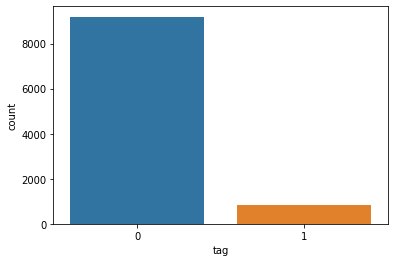

In [51]:
sns.countplot(t1_training.tag)

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


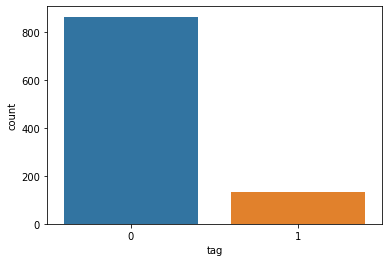

In [52]:
sns.countplot(t1_test.tag)

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


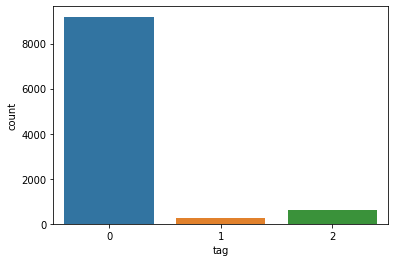

In [53]:
sns.countplot(t2_training.tag)

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


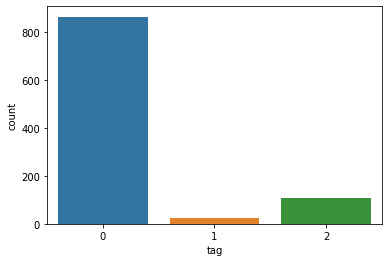

In [54]:
sns.countplot(t2_test.tag)

#Train the following classifiers on the training sets (for the task 1 and the task 2):
* Bayesian classifier with TF * IDF weighting.
* Fasttext text classifier
* Transformer classifier (take into account that a number of experiments should be performed for this model).

## Bayesian

In [55]:
t1_tfidf_vectorizer = TfidfVectorizer()
t2_tfidf_vectorizer = TfidfVectorizer()

In [56]:
t1_X_train_tfidf = t1_tfidf_vectorizer.fit_transform(t1_training.text)
t1_X_train_tfidf.shape

(10041, 22872)

In [57]:
t1_tfidf_clf = GaussianNB().fit(t1_X_train_tfidf.toarray(), t1_training.tag)

In [58]:
t1_X_test_tfidf = t1_tfidf_vectorizer.transform(t1_test.text)
t1_X_test_tfidf.shape

(1000, 22872)

In [59]:
t1_tfidf_predicted = t1_tfidf_clf.predict(t1_X_test_tfidf.toarray())

In [60]:
t1_tfidf_acc = np.mean(t1_tfidf_predicted == t1_test.tag)
print(f'Task1 Bayesian classifier with TFIDF accuracy: {t1_tfidf_acc}')

Task1 Bayesian classifier with TFIDF accuracy: 0.782


In [61]:
t2_X_train_tfidf = t2_tfidf_vectorizer.fit_transform(t2_training.text)
t2_X_train_tfidf.shape

(10041, 22872)

In [62]:
t2_tfidf_clf = GaussianNB().fit(t2_X_train_tfidf.toarray(), t2_training.tag)

In [63]:
t2_X_test_tfidf = t2_tfidf_vectorizer.transform(t2_test.text)
t2_X_test_tfidf.shape

(1000, 22872)

In [64]:
t2_tfidf_predicted = t1_tfidf_clf.predict(t2_X_test_tfidf.toarray())

In [65]:
t2_tfidf_acc = np.mean(t2_tfidf_predicted == t2_test.tag)
print(f'Task2 Bayesian classifier with TFIDF accuracy: {t2_tfidf_acc}')

Task2 Bayesian classifier with TFIDF accuracy: 0.755


## fastText

In [66]:
t1_train_ft_file = 't1_fastText.txt'
t2_train_ft_file = 't2_fastText.txt'

In [67]:
def create_fasttext_file(dataset, file_name):
    with open(file_name, 'w+') as file:
        for i in dataset.index:
            line = f'__label__{dataset.tag[i]} {dataset.text[i]}\n'
            file.write(line)

In [68]:
create_fasttext_file(t1_training, t1_train_ft_file)

In [69]:
create_fasttext_file(t2_training, t2_train_ft_file)

In [70]:
!head -n 10 t1_fastText.txt

__label__0 Dla mnie faworytem do tytułu będzie Cracovia. Zobaczymy, czy typ się sprawdzi.
__label__0 @anonymized_account @anonymized_account Brawo ty Daria kibic ma być na dobre i złe
__label__0 @anonymized_account @anonymized_account Super, polski premier składa kwiaty na grobach kolaborantów. Ale doczekaliśmy czasów.
__label__0 @anonymized_account @anonymized_account Musi. Innej drogi nie mamy.
__label__0 Odrzut natychmiastowy, kwaśna mina, mam problem
__label__0 Jaki on był fajny xdd pamiętam, że spóźniłam się na jego pierwsze zajęcia i to sporo i za karę kazał mi usiąść w pierwszej ławce XD
__label__0 @anonymized_account No nie ma u nas szczęścia 😉
__label__0 @anonymized_account Dawno kogoś tak wrednego nie widziałam xd
__label__0 @anonymized_account @anonymized_account Zaległości były, ale ważne czy były wezwania do zapłaty z których się klub nie wywiązał.
__label__1 @anonymized_account @anonymized_account @anonymized_account Gdzie jest @anonymized_account . Brudziński jesteś kłam

In [71]:
t1_fasttext_clf = fasttext.train_supervised(t1_train_ft_file)
t2_fasttext_clf = fasttext.train_supervised(t2_train_ft_file)

In [72]:
# na początku brakowało pamięci w colab
def fasttext_minibatch_predict(model, test_data, batch_size=100):
    predicted = []
    n_minibatches = len(test_data) // batch_size   
    for i in range(n_minibatches + 1): 
        s = i * batch_size
        e = (i + 1) * batch_size
        if e < len(test_data):
            mini_batch = test_data[s:e]
        else:
            mini_batch = test_data[s:] 
        predicted.append(model.predict(mini_batch))
    return predicted
def fasttext_label_to_int(predicted):
    result = []
    for label in predicted:
        result.append(int(label[0][-1]))
    return result

In [73]:
# fasttext_minibatch_predict(t1_fasttext_clf, t1_test.text.to_list())

In [74]:
t1_fasttext_predicted = t1_fasttext_clf.predict(t1_test.text.to_list())
t2_fasttext_predicted = t2_fasttext_clf.predict(t2_test.text.to_list())

t1_fasttext_prob = t1_fasttext_predicted[1]
t1_fasttext_predicted = fasttext_label_to_int(t1_fasttext_predicted[0])
t2_fasttext_prob = t2_fasttext_predicted[1]
t2_fasttext_predicted = fasttext_label_to_int(t2_fasttext_predicted[0])

In [75]:
t1_ft_acc = np.mean(t1_fasttext_predicted == t1_test.tag)
print(f'Task1 fastText classifier accuracy: {t1_ft_acc}')

Task1 fastText classifier accuracy: 0.873


In [76]:
t2_ft_acc = np.mean(t2_fasttext_predicted == t2_test.tag)
print(f'Task2  fastText classifier accuracy: {t2_ft_acc}')

Task2  fastText classifier accuracy: 0.868


## Transformer classifier

In [77]:
t1_trasformer_training_data = pd.DataFrame({
    'text': t1_training.text,
    'labels': t1_training.tag
})
t2_trasformer_training_data = pd.DataFrame({
    'text': t2_training.text,
    'labels': t2_training.tag
})

In [78]:
t1_transformer_args = ClassificationArgs(num_train_epochs=1, overwrite_output_dir=True, silent=False)

t1_transformer = ClassificationModel(model_type='roberta', model_name='roberta-base', num_labels=2, use_cuda=True, args=t1_transformer_args)

Some weights of the model checkpoint at roberta-base were not used when initializing RobertaForSequenceClassification: ['lm_head.bias', 'lm_head.dense.weight', 'lm_head.dense.bias', 'lm_head.layer_norm.weight', 'lm_head.layer_norm.bias', 'lm_head.decoder.weight']
- This IS expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at roberta-base and are newly initialized: ['classifier.dense.weight', 'classifier.dense.bias', 'classifier.out_proj.weight', 'classifier.out

In [79]:
t1_transformer.train_model(t1_trasformer_training_data)

Please also save or load the state of the optimizer when saving or loading the scheduler.


(1256, 0.31899771796929455)

In [80]:
t1_tranformer_predictions, t1_tranformer_raw_outputs = t1_transformer.predict(t1_test.text.to_list())

In [81]:
t2_transformer_args = ClassificationArgs(num_train_epochs=1, overwrite_output_dir=True, silent=False)

t2_transformer = ClassificationModel(model_type='roberta', model_name='roberta-base', num_labels=3, use_cuda=True, args=t2_transformer_args)

Some weights of the model checkpoint at roberta-base were not used when initializing RobertaForSequenceClassification: ['lm_head.bias', 'lm_head.dense.weight', 'lm_head.dense.bias', 'lm_head.layer_norm.weight', 'lm_head.layer_norm.bias', 'lm_head.decoder.weight']
- This IS expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at roberta-base and are newly initialized: ['classifier.dense.weight', 'classifier.dense.bias', 'classifier.out_proj.weight', 'classifier.out

In [82]:
t2_transformer.train_model(t2_trasformer_training_data)

Please also save or load the state of the optimizer when saving or loading the scheduler.


(1256, 0.37901359121648853)

In [83]:
t2_tranformer_predictions, t2_tranformer_raw_outputs = t2_transformer.predict(t2_test.text.to_list())

In [84]:
t1_transformer_acc = np.mean(t1_tranformer_predictions == t1_test.tag)
print(f'Task1 transformer classifier accuracy: {t1_transformer_acc}')

Task1 transformer classifier accuracy: 0.866


In [85]:
t2_transformer_acc = np.mean(t2_tranformer_predictions == t2_test.tag)
print(f'Task2 transformer classifier accuracy: {t2_transformer_acc}')

Task2 transformer classifier accuracy: 0.866


# Compare the results of classification on the test set.

In [86]:
print(f'ACCURACY: \n\nTAKS 1:\n\t Bayesian with TFIDF: \t{t1_tfidf_acc}\n\t fastText: \t\t{t1_ft_acc}\n\t roberta tansformer: \t{t1_transformer_acc}'+
      f'\n\nTAKS 2:\n\t Bayesian with TFIDF: \t{t2_tfidf_acc}\n\t fastText: \t\t{t2_ft_acc}\n\t roberta tansformer: \t{t1_transformer_acc}')

ACCURACY: 

TAKS 1:
	 Bayesian with TFIDF: 	0.782
	 fastText: 		0.873
	 roberta tansformer: 	0.866

TAKS 2:
	 Bayesian with TFIDF: 	0.755
	 fastText: 		0.868
	 roberta tansformer: 	0.866


Dla zadania pierwszego najlepiej dopasował się fastText, natomiast dla drugiego transformer uzyskał bardzo zbliżone wyniki.

In [ ]:
t1_tfidf_f1_macro = f1_score(t1_test.tag, t1_tfidf_predicted, average='macro')
t2_tfidf_f1_macro = f1_score(t2_test.tag, t2_tfidf_predicted, average='macro')

t1_tfidf_f1_micro = f1_score(t1_test.tag, t1_tfidf_predicted, average='micro')
t2_tfidf_f1_micro = f1_score(t2_test.tag, t2_tfidf_predicted, average='micro')

t1_ft_f1_macro = f1_score(t1_test.tag, t1_fasttext_predicted, average='macro')
t2_ft_f1_macro = f1_score(t2_test.tag, t2_fasttext_predicted, average='macro')

t1_ft_f1_micro = f1_score(t1_test.tag, t1_fasttext_predicted, average='micro')
t2_ft_f1_micro = f1_score(t2_test.tag, t2_fasttext_predicted, average='micro')

t1_transformer_f1_macro = f1_score(t1_test.tag, t1_tranformer_predictions, average='macro')
t2_transformer_f1_macro = f1_score(t2_test.tag, t2_tranformer_predictions, average='macro')

t1_transformer_f1_micro = f1_score(t1_test.tag, t1_tranformer_predictions, average='micro')
t2_transformer_f1_micro = f1_score(t2_test.tag, t2_tranformer_predictions, average='micro')


t1_tfidf_MCC = matthews_corrcoef(t1_test.tag, t1_tfidf_predicted)
t2_tfidf_MCC = matthews_corrcoef(t2_test.tag, t2_tfidf_predicted)

t1_ft_MCC = matthews_corrcoef(t1_test.tag, t1_fasttext_predicted)
t2_ft_MCC = matthews_corrcoef(t2_test.tag, t2_fasttext_predicted)

t1_transformer_MCC = matthews_corrcoef(t1_test.tag, t1_tranformer_predictions)
t2_transformer_MCC = matthews_corrcoef(t2_test.tag, t2_tranformer_predictions)

In [88]:
print(f'\tF1_SCORE MACRO: \n\nTAKS 1:\n\t Bayesian with TFIDF: \t{t1_tfidf_f1_macro}\n\t fastText: \t\t{t1_ft_f1_macro}\n\t roberta tansformer: \t{t1_transformer_f1_macro}\
      \n\nTAKS 2:\n\t Bayesian with TFIDF: \t{t2_tfidf_f1_macro}\n\t fastText: \t\t{t2_ft_f1_macro}\n\t roberta tansformer: \t{t2_transformer_f1_macro}')

print(f'\n\n----------------------------------------------------\n\
        F1_SCORE MICRO: \n\nTAKS 1:\n\t Bayesian with TFIDF: \t{t1_tfidf_f1_micro}\n\t fastText: \t\t{t1_ft_f1_micro}\n\t roberta tansformer: \t{t1_transformer_f1_micro}\
      \n\nTAKS 2:\n\t Bayesian with TFIDF: \t{t2_tfidf_f1_micro}\n\t fastText: \t\t{t2_ft_f1_micro}\n\t roberta tansformer: \t{t2_transformer_f1_micro}')

print(f'\n\n----------------------------------------------------\n\
        Matthews correlation coefficient (MCC): \n\nTAKS 1:\n\t Bayesian with TFIDF: \t{t1_tfidf_MCC}\n\t fastText: \t\t{t1_ft_MCC}\n\t roberta tansformer: \t{t1_transformer_MCC}\
      \n\nTAKS 2:\n\t Bayesian with TFIDF: \t{t2_tfidf_MCC}\n\t fastText: \t\t{t2_ft_MCC}\n\t roberta tansformer: \t{t2_transformer_MCC}')


	F1_SCORE MACRO: 

TAKS 1:
	 Bayesian with TFIDF: 	0.5701858847467252
	 fastText: 		0.5939365453911798
	 roberta tansformer: 	0.4640943193997856      

TAKS 2:
	 Bayesian with TFIDF: 	0.33649384374022057
	 fastText: 		0.36843539780455736
	 roberta tansformer: 	0.3093962129331904


----------------------------------------------------
        F1_SCORE MICRO: 

TAKS 1:
	 Bayesian with TFIDF: 	0.782
	 fastText: 		0.8729999999999999
	 roberta tansformer: 	0.866      

TAKS 2:
	 Bayesian with TFIDF: 	0.755
	 fastText: 		0.868
	 roberta tansformer: 	0.866


----------------------------------------------------
        Matthews correlation coefficient (MCC): 

TAKS 1:
	 Bayesian with TFIDF: 	0.1428942557422714
	 fastText: 		0.2650301059500807
	 roberta tansformer: 	0.0      

TAKS 2:
	 Bayesian with TFIDF: 	0.10549526649348498
	 fastText: 		0.16001981125515372
	 roberta tansformer: 	0.0


## SHAP explanations:
najlepszym klasyfikatorem w moim przypadku okazał sie fastText i to do niego zrobię porównanie.

In [89]:
def get_confusion_sample(y_test, X_test, predicted):
    tp = None
    tn = None
    fp = None
    fn = None
    negatives = [0]
    positives = [1, 2]
    for i in range(len(predicted)):
        t = y_test[i]
        p = predicted[i]
        text = X_test[i]
        if p in positives and t in positives and p == t:
            tp = text
        elif p in positives and t in negatives:
            fp = text
        elif p in negatives and t in positives:
            fn = text
        elif p in negatives and t in negatives and p == t:
            tn = text

        if all([tn, fp, fn, tp]):
            return(tn, fp, fn, tp)
    return(tn, fp, fn, tp)

In [90]:
t1_best_clf_predictions = t1_fasttext_predicted
t1_tn, t1_fp, t1_fn, t1_tp = get_confusion_sample(t1_test.tag, t1_test.text, t1_best_clf_predictions)

t2_best_clf_predictions = t2_fasttext_predicted
t2_tn, t2_fp, t2_fn, t2_tp = get_confusion_sample(t2_test.tag, t2_test.text, t2_best_clf_predictions)

print(f'TAKS1\n TN: {t1_tn}\n FP: {t1_fp}\n FN: {t1_fn}\n TP: {t1_tp}')
print(f'\nTAKS2\n TN: {t2_tn}\n FP: {t2_fp}\n FN: {t2_fn}\n TP: {t2_tp}')

# t2_best_clf_predictions = t2_fasttext_predicted
# t2_confusion_matrix = confusion_matrix(t2_test.tag, t2_best_clf_predictions)
# FP = t2_confusion_matrix.sum(axis=0) - np.diag(t2_confusion_matrix)  
# FN = t2_confusion_matrix.sum(axis=1) - np.diag(t2_confusion_matrix)
# TP = np.diag(t2_confusion_matrix)
# TN = t2_confusion_matrix.sum() - (FP + FN + TP)

TAKS1
 TN: @anonymized_account @anonymized_account @anonymized_account Prawda o Karczewskim to nie prawda o Polsce. Coś się Panu pojebało @anonymized_account .
 FP: @anonymized_account @anonymized_account To Pani Krysia jest Twoją Ojczyzną?
 FN: @anonymized_account Oni akurat w dupie wnoszą bo to pedały i to dla nich nic nowego.
 TP: @anonymized_account Dokładnie wie co mówi. A Ty pajacu poczytaj ustawę domsie dowiesz kto decyduje o wysokości zarobków w samorządach.

TAKS2
 TN: @anonymized_account O Mójcie nie wspominając :)
 FP: @anonymized_account Bierz tego @anonymized_account razem jesteście mocni
 FN: @anonymized_account @anonymized_account Ola wiedziała że chodził do burdelu. Nadaję panu @anonymized_account w kategorii zjeb  roku 2018 pierwsze miejsce
 TP: @anonymized_account @anonymized_account Polska jest jedną? Dla protestujących w sejmie też? Ty kłamliwa gnido?


In [92]:
def explain(to_expl, X_train, train_proba, train_size=50, shap_explainer=shap.KernelExplainer):
    X_train_sample = shap.sample(X_train, train_size) 
    explainer = shap_explainer(train_proba, X_train_sample)
    shap_values = explainer.shap_values(to_expl, nsamples=4) 
    return explainer, shap_values

In [93]:
t1_to_expl = [t1_tn, t1_fp, t1_fn, t1_tp]
t1_to_expl_tfidf = t1_tfidf_vectorizer.transform(t1_to_expl) 
t2_to_expl = [t2_tn, t2_fp, t2_fn, t2_tp]
t2_to_expl_tfidf = t1_tfidf_vectorizer.transform(t1_to_expl) 

### Bayesian

In [96]:
shap.initjs()
explainer_t1, shap_values_t1 = explain(t1_to_expl_tfidf.toarray(), t1_X_train_tfidf.toarray(), t1_tfidf_clf.predict_proba)   
shap.force_plot(explainer_t1.expected_value[0], shap_values_t1[0], t1_to_expl, feature_names=t1_tfidf_vectorizer.get_feature_names())

Regressors in active set degenerate. Dropping a regressor, after 1 iterations, i.e. alpha=1.817e-02, with an active set of 1 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 2 iterations, i.e. alpha=9.085e-03, with an active set of 2 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 3 iterations, i.e. alpha=1.562e-04, with an active set of 3 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 1 iterations, i.e. alpha=2.956e-02, with an active set of 1 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a 

In [97]:
shap.initjs()
explainer_t2, shap_values_t2 = explain(t2_to_expl_tfidf.toarray(), t2_X_train_tfidf.toarray(), t2_tfidf_clf.predict_proba)   
shap.force_plot(explainer_t2.expected_value[0], shap_values_t2[0], t2_to_expl, feature_names=t1_tfidf_vectorizer.get_feature_names())

Regressors in active set degenerate. Dropping a regressor, after 1 iterations, i.e. alpha=7.479e-02, with an active set of 1 regressors, and the smallest cholesky pivot element being 1.490e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 2 iterations, i.e. alpha=3.739e-02, with an active set of 2 regressors, and the smallest cholesky pivot element being 2.581e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 2 iterations, i.e. alpha=3.739e-02, with an active set of 2 regressors, and the smallest cholesky pivot element being 1.490e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 3 iterations, i.e. alpha=1.080e-02, with an active set of 3 regressors, and the smallest cholesky pivot element being 1.490e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a 

### fastText

In [98]:
shap.initjs()
explainer_ft, shap_values_ft = explain(t1_fasttext_clf, t1_training.text, t1_fasttext_clf.predict, shap_explainer=shap.DeepExplainer)   
shap.force_plot(explainer_ft.expected_value[0], shap_values_ft[0], t1_training.text)

keras is no longer supported, please use tf.keras instead.


AssertionError: ignored

## Transormer

# Podsumowanie
Nie udało mi się uruchomić shap dla fastText i dla transformerów, znalazlem strony mówiące, iż nie są one narazie obsługiwane.

## Which of the classifiers works the best for the task 1 and the task 2.
W moim przypadku najlepiej spisał się fastText dla praktycznie wszystkich miar, co ciekawe transformer uzyskał dokładnie taki sam wynik dla task 1 i 2.

##Did you achieve results comparable with the results of PolEval Task?
Może modele nie zajęłyby pierwszych miejsc, ale dokładność na poziomie ~87% nie przedstawia ich tak źle.

##Did you achieve results comparabie with the Klej leaderboard?
W przypadku tego leaderboardu sytuacja wygląda podobnie.

##Describe strengths and weaknesses of each of the compared algorithms.
Przewagą Bayesa na pozostałymi jest jego prostota, szybkość uczenia i wynik, który w porównaniu do czasu i skomplikowania uczenia jest całkiem niezły. FastText według mnie okazał się najlepszy gdyż wymagał tylko trochę więcej czasu na wyuczenie, a dał znacząco lepsze efekty. Transformer natomiast pomimo tego, iż dał bardzo dobre wyniki, często zbliżone do FT, natomiast czas jego uczenia był znacząco większy, pomimo puszczenia tylko jednej epoki, ma on jednak potencjał, gdyby go puścić na lepszym sprzęcie i na dłuższy czas dałby prawdopodobnie znacząco lepsze wyniki, co sugerują oba leaderboardy w których na pierwszych miejscach jest właśnie RoBERTa (dla KLEJ na 3 pierwszych).

##Do you think comparison of raw performance values on a single task is enough to assess the value of a given algorithm/model?
Zdecydowanie nie, jednym ze znaczących problemów, które zauważam w tym zadaniu jest to, że klasy w zbiorach są wysoce niezbalansowane. To skutkuje trudniejszym trenowaniem, szczególnie dużych modeli neuoronowych.
Warto też wziąć pod uwagę samą specyfikę modeli, które mogą dla jednego typu zadań działać lepiej, a dla innych gorzej, dlatego dla każdego zadania warto sprawdzić ponownie modele, które nawet z doświadczenia wiemy, że dawały słabe wyniki, bo tym razem mogą okazać się najlepsze.

##Did SHAP show that the models use valuable featurs/words when performing their decision?
Dla tak skomplikowanych modeli o bardzo dużej liczbie cech ciężko było ocenić na podstawie czego modele decydują, na pewno nie tak dobrze jak dla zbioru irysów na którym twórcy SHAP chwalą się jak świetnie tłumaczą klasyfikatory.